In [1]:
!pip install machine-learning-datasets shap lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 801.9 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 29.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 25.2 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=cfd36d7c68ad2eefa8a96f9ea1a4cb5c588e607e1d8f19841335561446399d31
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 req

In [2]:
import math
import re # regex
import machine_learning_datasets as mldatasets
import pandas as pd
import numpy as np
import nltk # natural language toolkit
from nltk.probability import FreqDist
from nltk.tokenize import  word_tokenize
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn import metrics, svm
from sklearn.feature_extraction.text import TfidfVectorizer
import lightgbm as lgb # modelo para aprender de texto
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime # local interpretable model agnostic Expanations
import lime.lime_tabular
from lime.lime_text import LimeTextExplainer

In [3]:
chocolaterating_df = mldatasets.load("chocolate-bar-ratings_v2")

https://github.com/PacktPublishing/Interpretable-Machine-Learning-with-Python/raw/master/datasets/chocolate-ratings_v2.zip downloaded to /content/data/chocolate-ratings_v2.zip
/content/data/chocolate-ratings_v2.zip uncompressed to /content/data/chocolate-ratings_v2
1 dataset files found in /content/data/chocolate-ratings_v2 folder
parsing /content/data/chocolate-ratings_v2/chocolate_v2.csv


In [4]:
chocolaterating_df

,company,company_location,review_date,country_of_bean_origin,cocoa_percent,rating,counts_of_ingredients,cocoa_butter,vanilla,lecithin,salt,sugar,sweetener_without_sugar,first_taste,second_taste,third_taste,fourth_taste
0,5150,U.S.A,2019,Madagascar,76.0,3.75,3,1,0,0,0,1,0,cocoa,blackberry,robust,NaN
1,5150,U.S.A,2019,Dominican republic,76.0,3.50,3,1,0,0,0,1,0,cocoa,vegetal,savory,NaN
2,5150,U.S.A,2019,Tanzania,76.0,3.25,3,1,0,0,0,1,0,rich,fatty,bready,NaN
3,A. Morin,France,2012,Peru,63.0,3.75,4,1,0,1,0,1,0,fruity,melon,roasty,NaN
4,A. Morin,France,2012,Bolivia,70.0,3.50,4,1,0,1,0,1,0,vegetal,nutty,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,Austria,2014,Blend,80.0,2.75,4,1,0,0,1,0,1,waxy,cloying,vegetal,NaN
2220,Zotter,Austria,2017,Colombia,75.0,3.75,3,1,0,0,0,1,0,strong nutty,marshmallow,NaN,NaN
2221,Zotter,Austria,2018,Belize,72.0,3.50,3,1,0,0,0,1,0,muted,roasty,accessible,NaN
2222,Zotter,Austria,2018,Congo,70.0,3.25,3,1,0,0,0,1,0,fatty,mild nuts,mild fruit,NaN


#Data Preparation:
Separamos los datos de tipo texto de los numéricos

In [5]:
tastes_df = chocolaterating_df[['first_taste','second_taste', 'third_taste', 'fourth_taste']]
chocolaterating_df = chocolaterating_df.drop(['first_taste','second_taste', 'third_taste', 'fourth_taste'], axis=1)
tastes_df.head(90).tail(10)

,first_taste,second_taste,third_taste,fourth_taste
80,oily,vegetal,nutty,cocoa
81,oily,vanilla,melon,cocoa
82,rich,sour,mild smoke,NaN
83,fruity,sour,NaN,NaN
84,roast,high astringent,NaN,NaN
85,smokey,savory,NaN,NaN
86,sandy,roasty,nutty,NaN
87,roasty,brownie,nutty,NaN
88,red wine,rich,long,NaN
89,creamy,fruit,cocoa,NaN


También vemos que hay muchisimas categorias para las ciudades de origen del cacao y lugar de origen de la compañia por lo que vamos a pone un límite para que si alguna ciudad aparece menos de un 3,33% de veces en los datos lo vamos a añadir en la categoría otros y vamos a codificar todas estas categorias. Basicamene pasamos de tenere una columna con distintas categorias a separar estas categorias en columnas nuevas binarias.

In [6]:
chocolaterating_df = mldatasets.make_dummies_with_limits(chocolaterating_df, 'company_location', 0.03333)
chocolaterating_df = mldatasets.make_dummies_with_limits(chocolaterating_df, 'country_of_bean_origin', 0.03333)
chocolaterating_df

,company,review_date,cocoa_percent,rating,counts_of_ingredients,cocoa_butter,vanilla,lecithin,salt,sugar,...,company_location_U.S.A,company_location_U.k.,country_of_bean_origin_Blend,country_of_bean_origin_Dominican_republic,country_of_bean_origin_Ecuador,country_of_bean_origin_Madagascar,country_of_bean_origin_Nicaragua,country_of_bean_origin_Other,country_of_bean_origin_Peru,country_of_bean_origin_Venezuela
0,5150,2019,76.0,3.75,3,1,0,0,0,1,...,1,0,0,0,0,1,0,0,0,0
1,5150,2019,76.0,3.50,3,1,0,0,0,1,...,1,0,0,1,0,0,0,0,0,0
2,5150,2019,76.0,3.25,3,1,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
3,A. Morin,2012,63.0,3.75,4,1,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
4,A. Morin,2012,70.0,3.50,4,1,0,1,0,1,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,2014,80.0,2.75,4,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
2220,Zotter,2017,75.0,3.75,3,1,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
2221,Zotter,2018,72.0,3.50,3,1,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
2222,Zotter,2018,70.0,3.25,3,1,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0


Tambien vamos eliminar todos los valores null por strings vacias y a juntar todos los atributos/columnas de tastes_df en una sola frase en lugar de 4 palabras sueltas. Finalmente se elmininan los espacios en blanco iniciales y finales.

In [7]:
tastes_s = tastes_df.replace(np.nan, '', regex=True).agg(' '.join, axis=1).str.strip()
print(tastes_s)

0          cocoa blackberry robust
1             cocoa vegetal savory
2                rich fatty bready
3              fruity melon roasty
4                    vegetal nutty
                   ...            
2219          waxy cloying vegetal
2220      strong nutty marshmallow
2221       muted roasty accessible
2222    fatty mild nuts mild fruit
2223            fatty earthy cocoa
Length: 2224, dtype: object


Veamos cuantas frases se repiten:

In [8]:
print(np.unique(tastes_s).shape)

(2178,)


Hay 2224 frases y tenemos 2178 elementos unicos, esto quiere decir que menos de 50 frases se repiten haciendo que sea una tontería tokenizar estas frases ya que casi todos los tokens serían distintos.

Podriamos usar varios metodos para solventar esto como usar tokens a partir de bigramas (usar 2 palabras en lugar de 1) usar subpalabras(dividir palabras en partes lógicas). Sin embargo aunque el orden importa un poco(ya que la primera palabra tiene relación con la primera degustación y sucesivamente), nuestro dataset es muy pequeño y tiene muchos valores nulos como para obtener significado a partir del orden. Por eso fue una buena elección concatenar todos los sabores juntos, eliminando si su división perceptible.

Tambien tenemos que darnos cuenta que la mayoria de palabras son adjetivos como afrutado pero hay tambien sustantivos como frua a pesar de que se ha intentado que no suceda esto y todas las palabras fuesen iguales para ese caso(ya que no creemos que quisiesen que significase 2 cosas distintas). Si hubiesemos estado seguro de esto podriamos haber usado la tecnica de "stemming and lemmatization"(raiz y forma) pero como son muy pocos casos, ni se plantea.

Vamos a ver cuales son las palabras mas frecuentes

In [9]:
nltk.download('punkt')
tastewords_fdist = FreqDist(word for word in word_tokenize(tastes_s.str.cat(sep=' '))) # contamos las veces que aparece una palabra
tastewords_df = pd.DataFrame.from_dict(tastewords_fdist,orient='index').rename(columns={0:'freq'}) # convertimos el diccionario en un dataframe
commontastes_l = tastewords_df[tastewords_df.freq > 74].index.to_list() # nos quedamos con las palabras que aparecen mas de 74 veces
print(commontastes_l)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


['cocoa', 'rich', 'fatty', 'roasty', 'nutty', 'sweet', 'sandy', 'sour', 'intense', 'mild', 'fruit', 'sticky', 'earthy', 'spice', 'molasses', 'floral', 'spicy', 'woody', 'coffee', 'berry', 'vanilla', 'creamy']


Podemos observar que la mayor parte de las palabras son distintas excepto spice y spicy. Lo que vamos a hace es añadir una columna booleana por cada palabra mas frecuene y ver si cada frase del dataset anterior contiene alguna de estas palabras o no.

In [10]:
chocolaterating_df['tastes'] = tastes_s
chocolaterating_df = mldatasets.make_dummies_from_dict(chocolaterating_df, 'tastes', commontastes_l) # añadimos las columnas binarizadas con las palabras mas frecuentes al dataset que contenía solo numeros

In [11]:
chocolaterating_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 46 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   company                                    2224 non-null   object 
 1   review_date                                2224 non-null   int64  
 2   cocoa_percent                              2224 non-null   float64
 3   rating                                     2224 non-null   float64
 4   counts_of_ingredients                      2224 non-null   int64  
 5   cocoa_butter                               2224 non-null   int64  
 6   vanilla                                    2224 non-null   int64  
 7   lecithin                                   2224 non-null   int64  
 8   salt                                       2224 non-null   int64  
 9   sugar                                      2224 non-null   int64  
 10  sweetener_without_sugar 

Podemos observar que todo son atributos numericos excepto las compañias. El atributo compañia cuenta con 500 empresas distintas y tokenizarlo seria mala idea ya que la gran mayoría de empresas no aparecen de forma recurrente en el dataset y se tendrian que añadir a la categoría de "otras" añadiendo un sesgo a nuestro modelo. Es por ello que es mejor eliminar esta categoría.

Finalmente vamos a poner como atributo de salida(rating) a 1 en las clases que presentan un rating mayor  o igual que 3.5 (el maximo es 5) y 0 si es menor que 3.5 (es decir, bamos a binarizar el atributo rating y usarlo como atributo a predecir ya que es lo que nos pide el probelma)y a repartir los datos en X, y y test y validación.

In [12]:
rand = 9
y = chocolaterating_df['rating'].apply(lambda x: 1 if x >=3.5 else 0)
X = chocolaterating_df.drop(['rating','company'], axis=1).copy() # eliminamos rating ya que es el atributo de salida y company por el motivo que hemos explicado antes.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state = rand)

Como vamos a usar un modelo especifico para entender texto(NLP Model= LightGBM) a parte de uno para datos numericos(SVM) si queremos usar la misma "y" para ambos modelos tenemos que hace que el dataset de strings se que teniamos(taste_s) se reparta de la misma forma en datos de entrenamiento y validacion que X_train y X_test.

In [13]:
X_train_nlp = tastes_s[X_train.index]
X_test_nlp = tastes_s[X_test.index]

#Usando SHAP's KernelExplainer para interpretaciones locales con valores SHAP
##Entrenando el modelo C-SVC (SVC para clasificación)

SVM de normal no da probabilidades ya que se basa en algebra lineal pero si usamos SKlearn y ponemos el parametro probability=true, sklearn usa valicacion-cruzada y ajusta/entrena un modelo de clasificación/regresión logística al SVC para obtener probabilidades. También usamos el parametro gamma=auto que significa que gamma es igual a 1/numerodeatributos. El parametro random lo usamos para reproducibilidad y una vez que entrenamos el modelo lo evaluamos con la funcion "evaluate_class_mdl" para evaluar el rendimiento de predicción de nuestro modelo

para graficar vamos a usar seaborn pero vamos a guardarnos los parametros por defecto de matplotlib para usarlos luego.

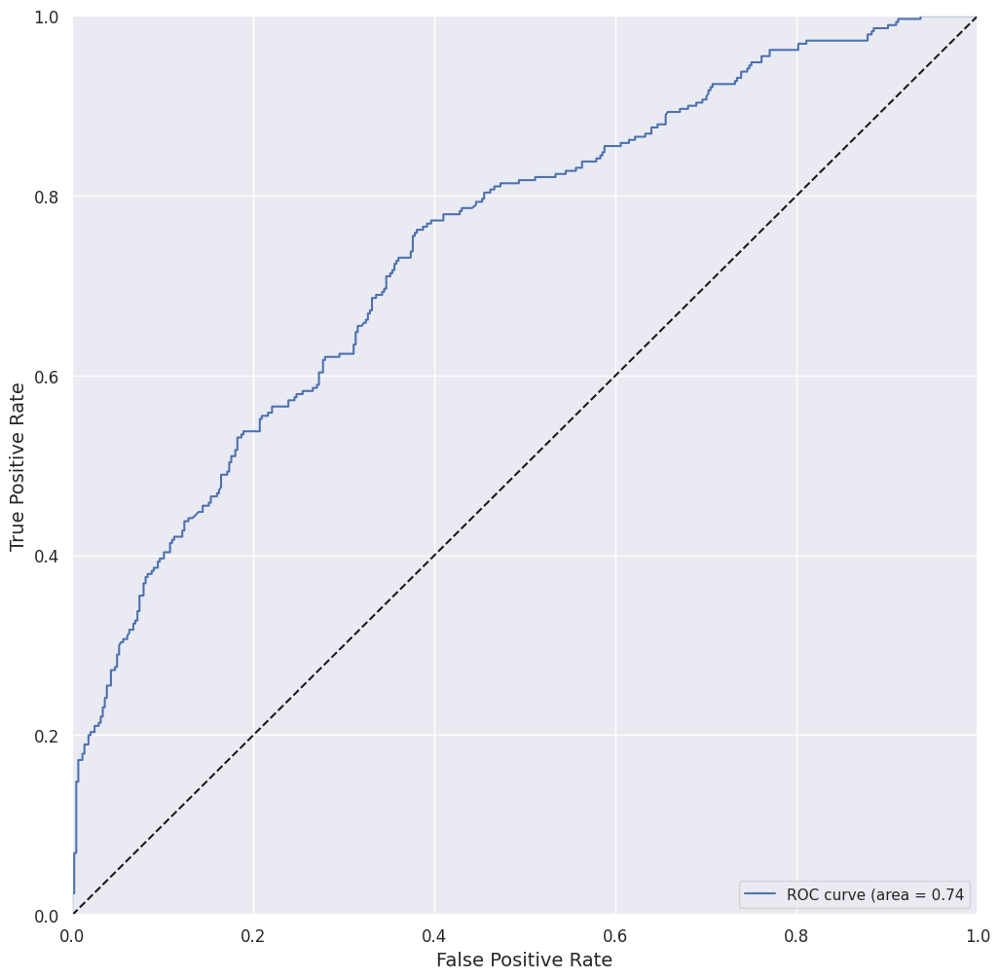

Accuracy_train:  0.7315		Accuracy_test:   0.6989
Precision_test:  0.6845		Recall_test:     0.4414
ROC-AUC_test:    0.7450		F1_test:         0.5367		MCC_test: 0.3461


In [14]:
orig_plt_params = plt.rcParams
sns.set() # establecemos seaborn como graficador por defecto
svm_mdl = svm.SVC(probability=True, gamma='auto', random_state=rand)
fitted_svm_mdl = svm_mdl.fit(X_train, y_train)
y_train_svc_pred, y_test_svc_prob, y_test_svc_pred = mldatasets.evaluate_class_mdl(fitted_svm_mdl, X_train, X_test, y_train, y_test)

Vemos que el rendimiento de nuestro modelo no es del todo malo considerando que es un dataset pequeño en una tarea compleja para machinelearing user rating's. Vemos que la curva ROC esta bastante por encima de la linea de puntos que representaria el mismo funcionamiento que tirar una moneda al aire y que el coeficiente de correlación de Matthews está convenientemente alejado de 0. Mas importante es que la precisión es bastante mas alto que el recall y esto en nuestro caso es bueno ya que detectar mal una chocolatina popular de una que no tiene bastante costo en este caso. Preferimos precisión por encima de recall ya que es mejor tener menos falsos positivos que falsos negativos.

## Calulando valores SHAP usando Kernel Explainer
*Antes que nada es importante saber el orden de indices de las clases de nuestro modelo para no confundirnos cuando usemos los valores de shap ya que estos son los valores que estamos intentando predecir. Vamos a imprimir los indices de nuestro modelo antes que nada.

In [15]:
svm_mdl.classes_

array([0, 1])

como podemos obserbar el primer indice es para la clase 0 (barrita que no gusta al publico) y el indice 1 clase 1(barrita que si gusta).

KernelExplainer usa varios argumentos. El primero es la función de prediccion del modelo utilizado, depues un dataset de entrenamiento (no tiene por que ser todo el dataset de entrenamiento utilizado) suele ser solo un fragmento ya que si no tardaría la vida. Otro metodo es usar un metodo como k-means para "resumir" nuestros datos de entrenamiento y pasarselo como argumento (en nuestro caso usamos 10 centroides k=10 y solo 200 ejemplos:nsamples=200). Además usa regularización L1(se asignan pesos a los distintos atributos hasta que los que mas influencia tienen en el resultado tienen un peso mas grande que los que no los cuales pueden tener un peso de 0) y le indicamos que use el metodo de regularización hasta que nos queden solo los 20 atributos mas relevantes. Si fuese regularización L2 los atributos de menor importancia no tendrian nunca un peso de 0. Estos metodos de regularización ayudan mucho también para evitar overfitting.

In [16]:
np.random.seed(rand)
X_train_summary = shap.kmeans(X_train, 10)
shap_svm_explainer = shap.KernelExplainer(fitted_svm_mdl.predict_proba, X_train_summary)
shap_svm_values_test = shap_svm_explainer.shap_values(X_test, nsamples=200, l1_reg="num_features(20)")

  0%|          | 0/734 [00:00<?, ?it/s]

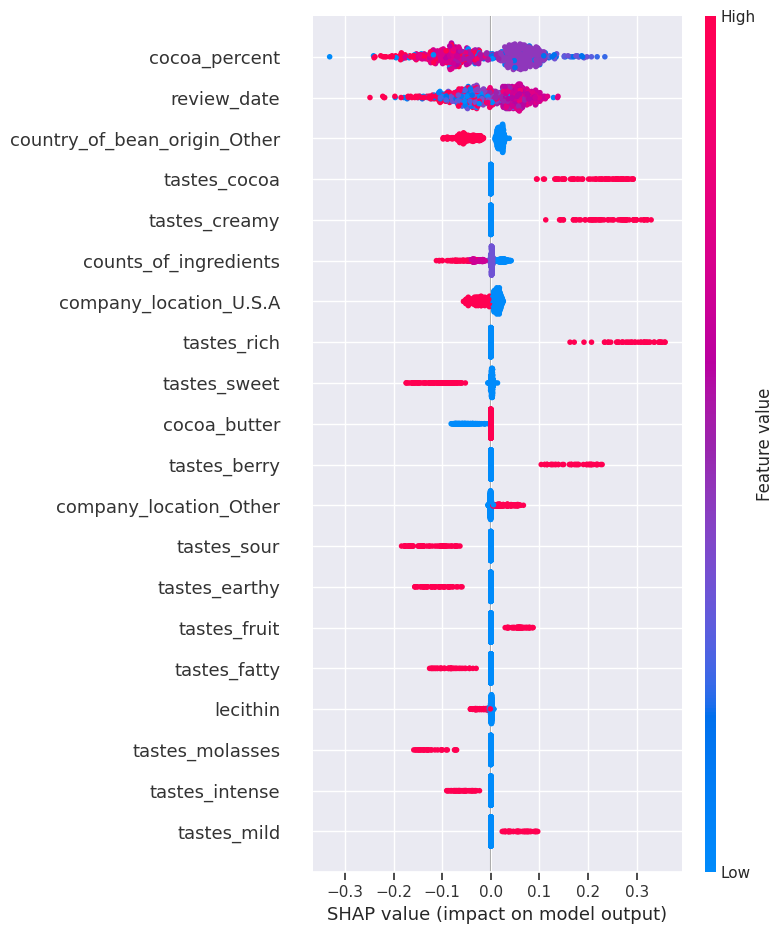

In [17]:
shap.summary_plot(shap_svm_values_test[1], X_test, plot_type="dot")

Para analizar las interpretaciones locales primero tenemos que empezar por las globales ya que podriamos ver indicadores contraintuitivos que podrian decirnos que algo hemos hecho mal y tenemos que revisar.

El atributo que mas destaca es el cacao en donde vemos que un porcentaje de cacao elevado (rojo) reduce bastane el que le guste a la gente (lo cual tiene sentido ya que es un sabor bastante de nicho) mientras que un valor medio si aumenta el agrado y un porcentaje bajo (azul) no parece que indique ninguna tendencia ya que está por todas las zonas presente aunque también podria ser por que faltasen datos.

También vemos como parece que hay mas probabilidades de que guste la barra para años antiguos que mas modernos aunque es dificil ver la tendencia ya que hay puntos morados por toda la zona. Sería mejor usar una función de dependecia como las vistas en el capítulo 4.

Finalmente para las clases binarisa es muy facil ver las tendencias y como influye un valor positivo o negativo en el resultado por ejemplo parece ser que a la gente no le gusta el chocolate de las compañias de estados unidos y que sabor a cacao y cremoso parece aumentar la probabilidad de que le guste a la gente.

# Interpretación local para un grupo de prediccioines usando una grafica de decisión (decisión Plot)
Para interpretación local no hace falta que estudiemos solo un punto/dato(con sus distintos atributos) en concreto, podemos utilzar varios a la vez mientras que tengamos contexto de cual es cual y no tengamos demasiados como para que nos impida entender algo. Para este ejercicio vamos a seleccionar solo las barras de chocolate del "cliente" ficticio.


In [18]:
sample_test_idx = X_test.index.get_indexer_for([5,6,7,18,19,21,24,25,27])

Lo bueno de los valores de SHAP es su propiedad aditiva. Si sumamos todos los valores de SHAP al valor esperado para obtenerlo podemos obter el resultado de la predicción. En este caso al ser probabilidades si es mayor que 0.5 tenemos una predicción positiva. Veamos si coincide con los resultados de los datos de entrenamiento "y_test_svc_pred"


In [19]:
expected_value = shap_svm_explainer.expected_value[1]
y_test_shap_pred = (shap_svm_values_test[1].sum(1) + expected_value) > 0.5
print(np.array_equal(y_test_shap_pred, y_test_svc_pred))

True


Deberiía ser True y así se demuestra.

In [20]:
expected_value

0.3803593470583057

SHAP's decision plot tiene una funcion para resaltar atributos que podemos usar para resaltar por ejemplo falsos negativos. Vamos a ver cuales de nuestros datos de entrenamiento son falsos negativos usando nuestros valores de SHAP para las barras de chocolate de la compañia "cliente"

In [21]:
FN = (~y_test_shap_pred[sample_test_idx]) & (y_test.iloc[sample_test_idx] == 1).to_numpy() # obtenemos las predicciones falsas que en realidad tendrían que ser positivas

vamos ahora a hacer ahora el grafico de decision que toma como argumentos los valores esperados, los valores de shap y los valores reales que deberían salir las y de los datos de entrenamiento para las barras de nuestro cliente en este caso. Tambie podemos pasar opcionalmente un array booleano de elementos que queramos remarcar con lineas de puntos que en este caso van a ser los falsos negativos.

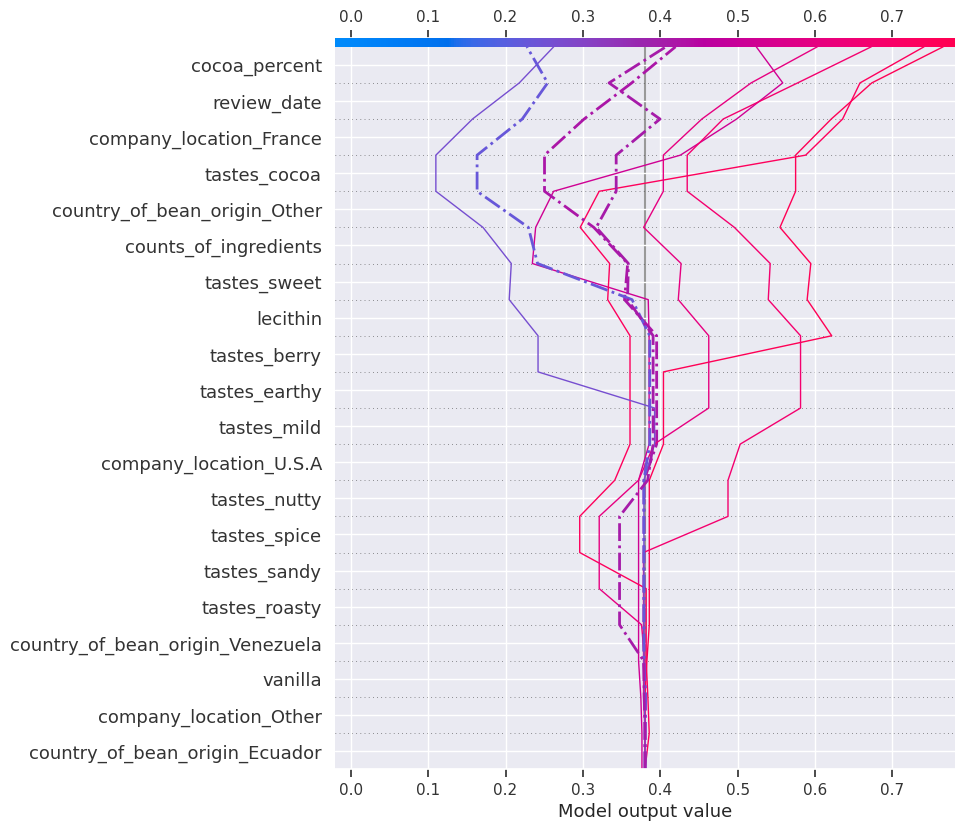

In [22]:
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx], X_test.iloc[sample_test_idx], highlight=FN)

# Importante: la grafica hay que "leerla" de abajo a arriba
El color de cada linea no representa el valor de ningun atributo sino que la salida del modelo. Como hemos usado la funcion predict proba en el KernelExplainer, este es una probabilidad, pero si hubisemos un modelo para regresión, se hubiera mostrado los valores de SHAP y el valores que tendrían cuando llegan a la parte del eje X es el valor predicho.

Losa tributos están ordenados en función de la importancia pero solo en función de las observaciónes graficadas y puedes ver como las lineas crecen o decrecen horizontalmente en funcion de los atributos. Cuanto varían y en que dirección dependen en la contribución del atributo en la salida.

La linea gris vertical representa el valor esperado de las clases el cual es como el intercept en un modelo lineal (w0). De hecho todas las lineas empiezan en este valor haciendo que sea mas facilde entender la grafica desde la parte de abajo hacia arriba

En la gráfica podemos ver 3 falsos negativos(lines de puntos) y podemos ver que atributos hacen que se  vayan mas hacia la izquierda produciéndo estos falsos negatios. Por ejemplo podemos ver como el falso negativo de mas a la izda está en la parte derecha del valor esperado hasta que llega el atributo lecticina y continua decreciendo hasta el atributo company_location_France y review_date_increadse que lo intentan llevar hacia la zona de "agrado del cliente/ clase positiva" pero no son suficiente. Tambien podemos observar como el atributo country_of_bean_origin_other afecta negativamente a 2 predicciones. Esto podria indicarnos que podría "haber una injusticia" ya que esta clase agrupa a mas de 50 paises pero que no tenian una frecuencia de aparición relevante en el dataset y por ende se les trataba a todas como iguales siendo probable que en realidad hubiese muchisima variacion entre las semillas de esas ubicaciones.

Los graficos de decision tambien pueden graficar solo una prediccion/observacion. Cuando se hace esto, se imprime los valores de cada atributo cerca de la linea de puntos. Vamos a probar a graficar un Verdadero positivo

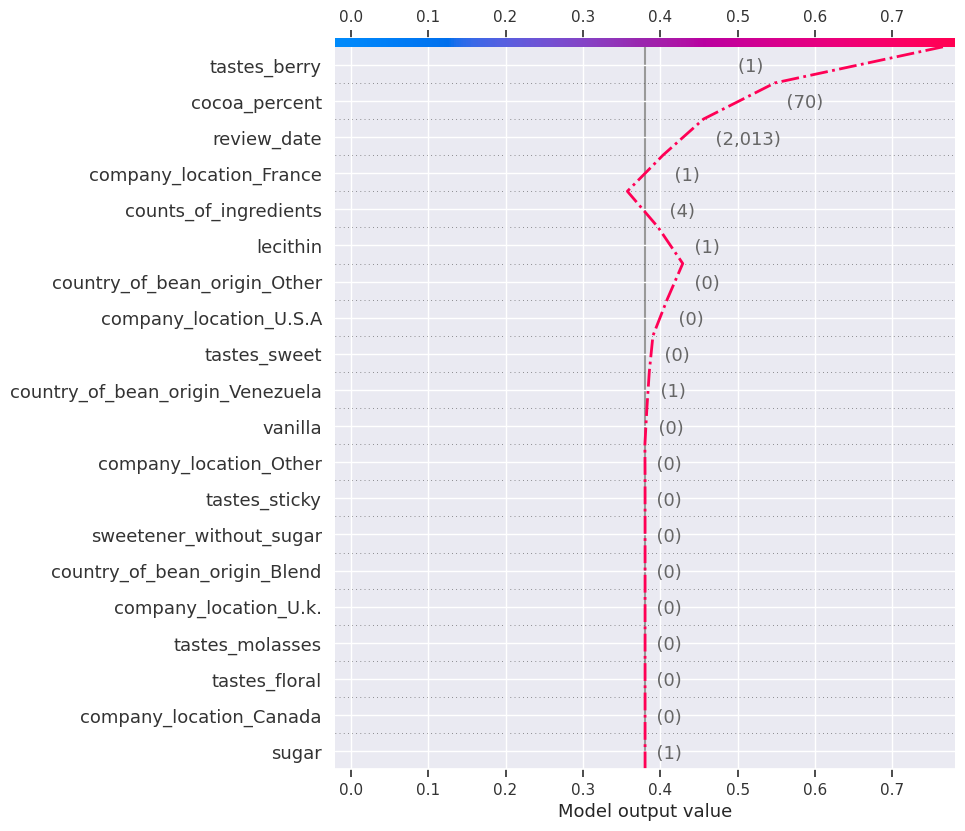

In [23]:
shap.decision_plot(expected_value, shap_svm_values_test[1][696], X_test.iloc[696], highlight=0)

En esta gráfica podemos observar como los atributos "lecticina" y "numero de ingredientes" hacen que la predicción de nuestro modelo hubisese corrido peligro pero afortunadamente el resto de atributos que están por encima sulla en la gráfica hacen que gire la linea y vaya al lugar donde deveria ir(predicción positiva)

## Interpretación local de una sola predicción a la vez usando Force Plot

Nuestro cliente nos pide que quieren comparar dos barras de chocolate. Barra #5 (barrita increible) vs barra #24 (decepcionante). Ambas estan en el dataset de test. Una forma de compararlas es poner los atributos de ambas barras juntas en un DataFrame y entender exactamente como difieren sus atributos. Tambien vamos a concatenar el valor de salida predicho(y_pred) y el que tienen realmente(y).

In [24]:
pd.set_option('display.precision', 0)
eval_idxs = X_test.index.isin([5,24])
X_test_eval = X_test[eval_idxs]
eval_compare_df = pd.concat([
    chocolaterating_df.iloc[X_test[eval_idxs].index].rating,
    pd.DataFrame({'y': y_test[eval_idxs]}, index=[5,24]),
    pd.DataFrame({'y_pred': y_test_svc_pred[eval_idxs]},
                 index=[24,5]),
    X_test_eval], axis=1).transpose()
eval_compare_df

,24,5
rating,3,4
y,0,1
y_pred,0,1
review_date,2015,2013
cocoa_percent,70,70
counts_of_ingredients,4,4
cocoa_butter,1,1
vanilla,0,0
lecithin,1,1
salt,0,0


Lo primero que tenemos que analizar es que las predicciónes son iguales que el resultado esperado, si no fuese así y hubiese habido un error de predicción podriamos realizar un análisis incorrecto. Dicho esto ahora podemos analizar las diferencias entre la barrita que gusta a la gente y la que no como por ejemplo la diferencia de 2 años en la review, el origen de la semilla de cacao (venezuela para la que gusta y otro para la que no) y que la que gusta tenia sabor a baya y la otra tenía sabor a "earthy" = terroso.

Hacer un grafico de fuerza puede ayudarnos a entender el porque de la decision de nuestro modelo (y en gran medida la de los clientes). Para ello vamos a necesitar el valor esperado para la clase de interes(el resultado que deberia tener la predicción), los valores de SHAP para la observación de interes (que predicción estamos analizando) y el valor real de la observación(los valores de los atributos de x). Vamos a empezar por la observación número 5.

In [25]:
shap.initjs()
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==5], X_test[X_test.index==5])

Podemos observar como los atributos que mas parecen influir positivamente son review_date, cocoa_percent y tastes_berry mientras que los que menos son counts_of_ingredients y lecithin

Comparemoslo con la otra chocolatina que tenía un sabor "earthy/terroso"

In [26]:
shap.initjs()
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==24], X_test[X_test.index==24])

Vemos como pese a que también influye de manera positiva el porcentaje de cacao, la fecha de review y la ubicación de la compañia en francia no es suficiente ya que el sabor terroso,el origen de la semilla = otro, la lecitina y el numero de ingredientes reduce muchísimo la probabilidad de agrado del cliente.

Tras obserbar ambos gráficos podemos ver que la principal diferencia es que una sabe a baya y la otra a tierra. También recordar que el atributo de origen de la semilla no tiene por que ser negativo y que haya que revisar bien los datos de esta categoria ya que hay mas de 50 regiones tratadas como iguales en esta categoría por que no habia mucha presencia de estas regiones en el dataset pudiendo producir errores en el modelo.

Kernel explainer usa algunos trucos aprendidos de LIME pero, que es realmente LIME(local interpretable model-agnostic explanations)

#LIME (local interpretable model-agnostic explanations)

Utilizar metodos de explicación global para explicaciones locales (tecnicas como SHAP) puede estar bien pero no tiene por que funcionar ya que los valores aprendidos de (correlaciones, importancia de atributos y decisiones a un nivel global) no tiene por que corresponder para un resultado local y aquí entra LIME.

Lo que se hace es: Se le indica que predicción quieres observar y se le da tu "black-box model" y una muestra de tu dataset(no todo). Despues hace predicciónes usando una versión modificada de tu muestra de datos que le va a ir permitiendo obserbar que bambios de caracteristicas tienen mayor efecto en la predicción de tu modelo si están cerca de los datos de los atributos de la prediccion a observar(a estos valores cercanos de los atributos se les llama vecindad). Despues utilizando esta muestra del dataset y las predicciones del modelo en esta vecindad, entrena un modelo ponderado subrogado interpretable intrínseacamente .

Palabras clabe:
- Chosen data point: valores de los atributo del dato de entrada que producen la predicción a observar.
- Perturbación: Lime simula nuevos datos aleatorios cercanos al punto de observación elegido añadiendole ruido.
- Esquema Ponderado / Weighting scheme: LIME usa un kernel de suavizado exponencial para tanto calcular el radio que va a definir la vecindad de los puntos usados para la perturbación como para obtener los pesos de los atributos segun los puntos se van alejando del punto elejido para observar en relación con los que están mas cerca.
- Distance: LIME una la distancia euclidea para datos en forma de tabla e imagenes y la similitud del coseno (cosine similarity) para texto.
- Intrinsecally interpretable surrogate model: LIME usa un modelo lineal disperso con regularizacion de Ridge para la ponderación de los coeficientes. sin embargo podría usar cualquier modelo intrinsecamente interpretable siempre y cuando los atributos de los puntos del dataset puedan ser ponderados. La idea detras de esto es doble: Necesita un modelo que pueda obtener de forma fiable parametros intrinsecamente interpretables y necesita considerar los puntos más cercanos al de observación como mas importantes.

La idea es la misma que hay en K-means, suponemos que puntos vecinos tendrán un comportamiento similar(etiquetas parecidas). Existen límites de decisión para los clasificadores, por lo que podría tratarse de una suposición muy ingenua cuando los puntos cercanos se dividen por uno. En LIME el radio de la distancia a los vecinos se calcula con la distancia a los vecinos y acorde a los puntos ponderados como el resto de modelos que usan la distancia a los vecinos salvo que este lo hace de forma exponencial. Además LIME no es un modelo de predicción sino que mide importancias de atributos por lo que las similitudes con estos modelos acaban aqui. Ajusta un modelo lineal ponderado subrogado y disperso por que asume que asume que cada modelo complejo es lineal de forma local y como no pertenece a la clase de "modelo", las predicciones que podría hacer no sirven para nada. Por esto mismo no hace ni falta que el modelo ajuste a la perfeccón este dataset que usa "manipulado" ya que solo te hace falta en verdad la magntud de los coeficientes aunque claro, siempre es mejor cuanto mas se ajuste por fidelidad en la interpretación.

LIME funciona muy bine para predicciones locales siempre y cuando la vecindad se elija bien(el tamaño del kernel adecuado y que se mantenga la suposición de que el modelo sigue una relación lineal en los datos vecions al punto elejido de observación)

## Interpretacion local para una sola predicción a la vez usando LimeTabularExplainer

Hay que instancias el model con:  
- Una muestra del dataset con formato numpy 2D (X_test.values).
- Una lista con el nombre de los atributos (X_test.columns).
- Una lista con los indices del dataset que son atributos categóricos (en nuestro caso todos menos los 3 primeros)
- Los nombres de las clases
- Tamaño del Kernel (Diametro de vecindad) indica que consideramos como "vecindario"
*Debido a la aleatoriedad que se usa para crear el dataset con ruido para LIME tienes que comprobar que el resultado obtenido sea consistente sino habria que reducir un poco el díametro para reducir el efecto de la aleatoriedad.

In [27]:
lime_svm_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,
                                                            feature_names=X_test.columns, categorical_features=list(range(3,44)),
                                                            class_names=['Not Highly Recomm.', 'Higly Recomm'])

Una vez tenemos el texto istanciado, podemos usar la función explain_instance para ajustar un modelo local subrogado para la observacion(prediccion que quermemos observar) #5. Tambien vamos a usar la función de clasificación de nuestro modelo y a limitar el numero de atributos que queremos estudiar a los 8 mas importantes. Hecho esto podemos visualizar al momento el resultado con show_in_notebook e indicar la probabilidad de la clase son predict_proba=True

In [28]:
lime_svm_explainer.explain_instance(X_test[X_test.index==5].values[0],
                                    fitted_svm_mdl.predict_proba,
                                    num_features=8).show_in_notebook(predict_proba=True)

X does not have valid feature names, but SVC was fitted with feature names


Si analizamos la grafica vemos que un porcentaje de cacao menor al 70% tiene un impacto positivo asi como que sepa a baya, que no sepa dulce, ni agrio, ni que tenga melaza mientras que que no tenga sabor a cacao, sepa cremoso ni rico tiene un impacto negativo aunque no lo suficiente como para que no le guste al cliente según el modelo.

Vamos a cambiar la observación que queremos estudiar de una que si gusta al publico (la #5) a uno que no gusta (#24)

In [29]:
lime_svm_explainer.explain_instance(X_test[X_test.index==24].values[0],
                                    fitted_svm_mdl.predict_proba,
                                    num_features=8).show_in_notebook(predict_proba=True)

X does not have valid feature names, but SVC was fitted with feature names


vemos como los 8 atributos que mas influyen en la predicción son los mismos que para la observación anterior salvo que ahora la unica diferencia es que al no saber a baya, tiene un efecto negativo devastado que hace que segun al modelo el cliente no le guste con un 74% de probabilidad

¡¡Importante!!. Hay una cosa que nos debe de extrañar y es que no aparece para la observación numero 24 el atributo de que sabe a tierra, que era la razon global (con los valores de SHAP) por la que esta barra no era del agrado por el cliente. Esto se debe a que da la casualidad que las observaciónes #5 y #24 son bastante similares y entran en el mismo vecindario. Este vecindario tiene muchas chocolatinas con sabor a baya y pocas con sabor a tierra haciendo que no sean suficientes como para considerar el que sepa a tierra como un atributo característico para diferencias entre chocolatinas ricas o no. El porque de esto podría ser doble:  
- El vecindario pequeño podría ser muy pequeño
- Los modelos lineales, dada su simplicidad y que esten sesgados por la relación sesgo-varianza y unicamente pudiendo ser debido a que el sabor a tierra parece como característica de muy pocas chocolatinas.

Esto será solucionado en la seccion siguiente del libro (Usando LIME para NLP).

# Usando LIME para NLP

Al principio del cuaderno separamos en datos de entrenamiento y validación todas las columnas de "sabores" limpiadas para NLP. vemos un extracto de este:

In [30]:
print(X_test_nlp)

1194                 roasty nutty rich
77      roasty oddly sweet marshmallow
121              balanced cherry choco
411                sweet floral yogurt
1259           creamy burnt nuts woody
                     ...              
327          sweet mild molasses bland
1832          intense fruity mild sour
464              roasty sour milk note
2013           nutty fruit sour floral
1190           rich roasty nutty smoke
Length: 734, dtype: object


Ningun modelo neuronal puede interpretar informazión como texto, es por ello por lo que tenemos que convertir esto a números es decir, vectorizar la información.

Hay muchas formas de hacer esto pero en nuestro caso no estamos interesados ni en la posición de las palabras ni en su semantica. Sino que estamos interesados en su frecuencia relativa (lo que era un problema en el apartado anterior).

Es por esto por lo "Term Frequency-Inverse Document Frequency (TF-IDF)" es el método ideal ya que evalua como de frecuente es la aparición de un termino(palabra) en un documento (cada frase). Sin embargo es ponderada en relación a su aparición en el corpus completo(todas las frases). Podemos vectorizar facilmente con la función TfidVectorizer de sklearn. Sin embargo para hacer las puntuaciones de TF-IDF solo tienes que ajustarlo para los datos de entrenamiento ya que de esa forma los datos de entrenamiento y validación transformados tienen una puntuación consistente para cada término.

In [31]:
vectorizer = TfidfVectorizer(lowercase=False)
X_train_nlp_fit = vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit = vectorizer.transform(X_test_nlp)

Para tener una idea de como se ven las puntuaciones del TF-IDF, podemos colocar todos los atributos en una columna del DataFrame y sus correspondientes notas al lado. Date cuenta de que como el vectorizado produce una matriz "sparse" de tipo "scipy", tenemos que convertirla a numpy usando la funcion todense() y despues a numpy con asarray(). Despues ordenamos la tabla en orden descendente.

In [32]:
pd.set_option('display.precision', 6)
pd.DataFrame({'taste': vectorizer.get_feature_names_out(),
             'tf-idf': np.asarray(X_test_nlp_fit[X_test_nlp.index==5].todense())[0]}).\
             sort_values(by='tf-idf', ascending=False).head(5)

,taste,tf-idf
305,raspberry,0.585538
259,nut,0.491542
265,oily,0.463973
64,caramel,0.447504
274,papaya,0.000000


Podemos observar como la puntuación de los atributos es un número normalizado entre 0 y 1 siendo 0 el mas frecuenet y 1 el que menos. Es interesante destacar como la observación número 5 tiene el sabor berry a 1 pero en los argumentos vemos que raspberry tiene una puntuación de las mas altas. Esto se debe a que el TF-IDF a buscado por la repeticion de berry sin inmportarle donde estubiese (en medio de una palabra, etc). Esto no es un problema ya que raspberry es un tipo de berry y no tiene su propia clase concreta pero hay que tener cuidado.

# Training a LightGBM model:


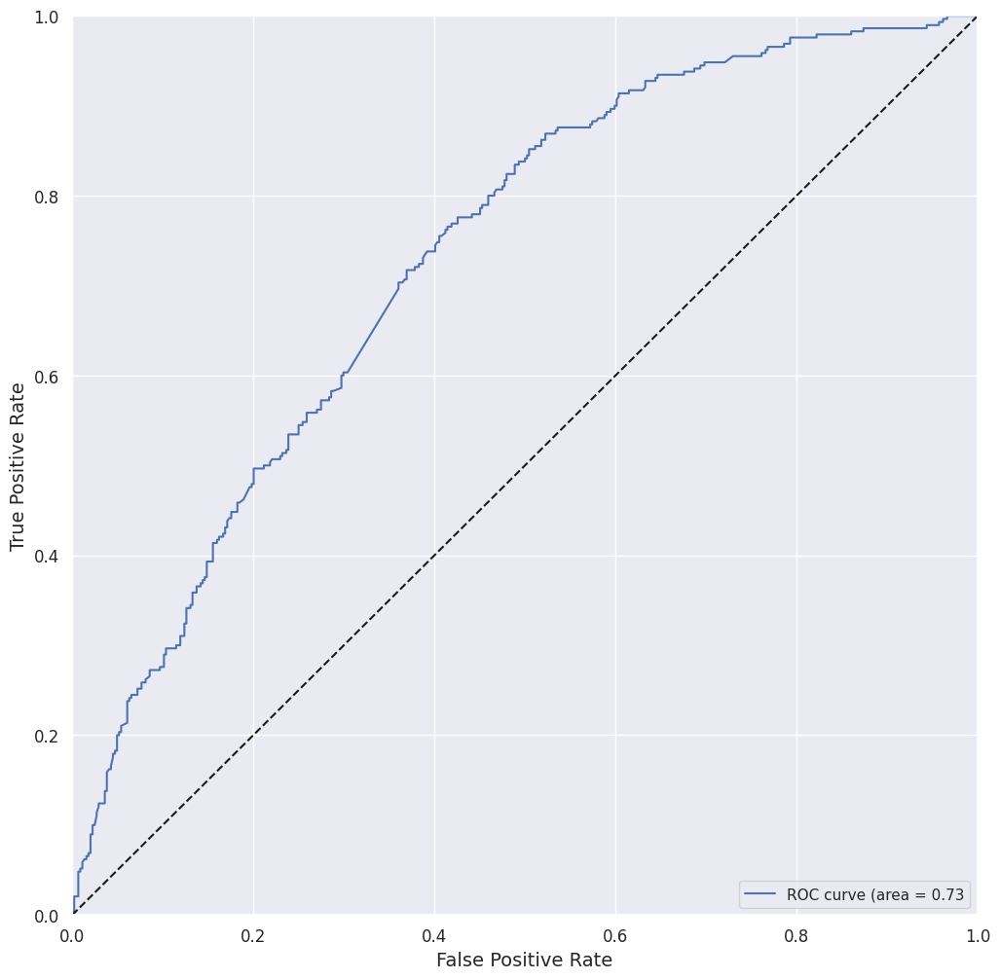

Accuracy_train:  0.7980		Accuracy_test:   0.6744
Precision_test:  0.6123		Recall_test:     0.4793
ROC-AUC_test:    0.7298		F1_test:         0.5377		MCC_test: 0.2973


In [33]:
sns.set()
lgb_mdl = lgb.LGBMClassifier(max_depth=13, learning_rate=0.05,\
            n_estimators=100, objective='binary', verbose=-1, force_row_wise=True,\
                             random_state=rand) # objective = clasificacion binaria, to avoid potential instability due to numerical issues, please set force_row_wise=true
fitted_lgb_mdl = lgb_mdl.fit(X_train_nlp_fit, y_train)
y_train_lgb_pred, y_test_lgb_prob, y_test_lgb_pred =\
      mldatasets.evaluate_class_mdl(fitted_lgb_mdl, X_train_nlp_fit,\
                                     X_test_nlp_fit, y_train, y_test)

El comportamiento del LightGBM es algo peor que el del SVM pero sigue estando bastante por encima de la zona de tirar una moneda. La misma idea de preferencia por Precision que por recall nuestra para este problema que vimos en el analisis del modelo SVM también se aplica aquí.

#Interpretación local para una sola predicción a la vez usando LimeTextExplainer

Para interpretar un modelo "black-box" con lime tenemos que pasarle la función de clasificación como la de "predict_proba" de nuestro modelo y usara esta función para hacer predicciones sobre los datos "perturbados/modificados" en el vecindario de la instancia y entrenar un modelo lineal con el. La instancia deberia ser numerica, es decir en su forma vectorial. Podriamos  vectorizar todo el dataset y darselo al modelo despues pero es mejor hacerlo segun queremos pasarle los datos al modelo. Para ello vamos a usar un pipeline con sklear(indicamos una secuencia de estimadores que transformaran nuestros datos seguido de un modelo que será entrenado con esos datos transformados) en nuestro caso solo se va a vectorizar los datos de entrada y despues pasarselo a nuestro modelo "lgb_model".

In [34]:
# el vectorizador es el mismo que usamos para vectorizar los datos de entrenamiento antes
lgb_pipeline = make_pipeline(vectorizer, lgb_mdl)

Inicializar un LimeTextExplainer es bastante simple. Se recomienda pasar el nombre de las clases para mejorar que sea más facil para nosotros analizar los  datos después. También recalcar que los argumentos opcionales como con LimeTabularExplainer, un diámetro de vecindad(kernel_width), puede ser critico si no se adecua a nuestros datos. Esto puede solucionarse por prueba y error.

In [35]:
lime_lgb_explainer = LimeTextExplainer(class_names=['Not Highly Recomm.', 'Highly Recomm.'])

Y ahora contrastemos la informacion para las predicciones numero #5 y #24

In [36]:
# num_features = 4 para que nos de solo los 4 atributos que mas afectan a la prediccion
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==5].values[0],
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

Podemos obserbar como el sabor a caramelo hace que la probabilidad de que le guste a la gente aumente pero que el sabor aceitoso lo reduce casi en la misma proporción aunque no es suficiente. En este caso sabor a nueces aumenta muy poco la probabilidad y sabor a baya no influye al menos debido acorde a la vecindad. Vemos que la probabilidad de preferencia es de un 51%, muy justita. En este caso la prediccion que hace lime(en probabilidad no en conclusión) es distinta que la del modelo. En este caso que no es mucha la diferencia no es demasiado relevante pero si la diferencia fuese considerable estaríamos hablando de una baja fidelidad del LIME.

Veamos ahora que pasa con la observación #24

In [37]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==24].values[0],
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

En este caso sabor a madera(rarete) y chocolate afectan positivamente y a tierra y quemado negativamente. Auque según los 4 primeros atributos que mas influyen la predicción deberia ser positiva, vemos como la probabilidad de que sea del agrado del cliente es de un 28%.

Dado que estamo usando un pipeline que vectoriza cuaquier texto vamos a hacer algunas pruebas. Probemos una grase con adjetivos postivos, una con negativos y otra con adjetivos que no ha visto nunca nuestro modelo.

In [38]:
lime_lgb_explainer.explain_instance('creamy rich complex fruity',
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('sour bitter roasty molasses',
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('nasty disgusting gross stuff',
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

Para la primera y segunda figura vemos como los adjetivos usados influyen positiva o negativamente respectivamente. Estas palabras son lo suficientemente comunes como para que sean apreciadas de forma local. Sin embargo para la tercera figura estaríamo cometiendo un error si creyesemos que la predicción tiene que ver algo con las palabras. Al ser 4 palabras que no ha visto el modelo nunca, la "sparse matrix" que representa esos datos sería todo ceros por ende el punto estaría en la "zona de chocolatina no recomendada". Es por esto por lo que el LIME encontro poco puntos distantes o ninguno en el vecindario y y eso lo reflejan los coeficientes del modelo subrogado.

# Trying SHAP for NLP (Natural Language Processing)

La mayoria de explicadores SHAP funcionan con datos en formato tabla e incluso imagenes, El "KernelExplainer" fue creado para ser realmente agnostico al modelo pero para modelos de texto el coste computacional es demasiado elevado debidua a la gran cantidad de atributos (todas las palabras distintas que suelen haber). Para nuestro caso donde solo hay unas cuantas palabras distintas y el top 100 de ellas se repite muchismo podría funcionar pero tenemos que sobrepasar igualmente algunas complicaciones tecnidas

1)Kernel explainer solo trabaja con modelos que retornan una unica prediccion cosa que nuestro modelo no hace ya que retorna la probabilidad de cada clase. Es por esto por lo que vamos a crear una función lambda que solo va a retornar la probabilidad de la clase "chocolatina altamente recomendada"

In [39]:
predict_fn = lambda X: lgb_mdl.predict_proba(X)[:,1]

2) KernelExplainer es incompatible con Scipy por lo que vamos a convertir los datos vectorizados en un array de numpy y despues los resultados lo pasaremos a un DataFrame de pandas para visualizarlos bien. También para reducir la complejidad computacional vamos a reducir la complejidad de los datos con el truco de kmeans como hemos hecho otras veces siendo el codigo empleado el mismo que para el SHAP realizado del modelo SVM.

  0%|          | 0/100 [00:00<?, ?it/s]

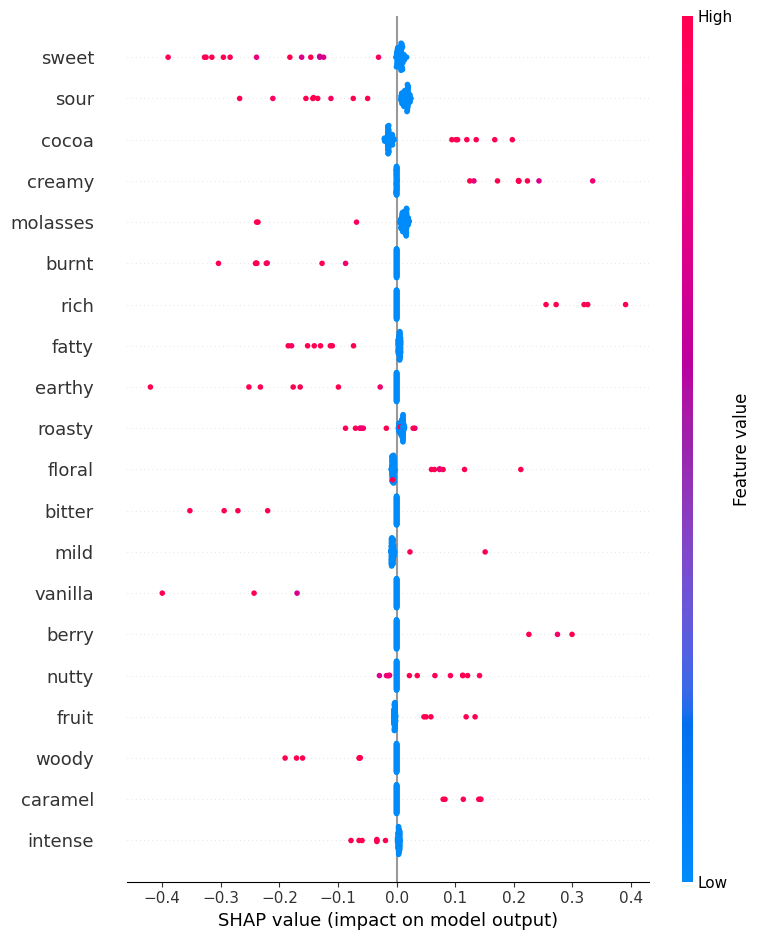

In [43]:
sns.reset_orig()
plt.rcParams.update(orig_plt_params) # volvemos a poner los parametros originales para graficar de matplotlib en lugar de seaborn
X_test_nlp_samp_df = pd.DataFrame(X_test_nlp_fit[:100].todense())
shap_lgb_explaienr = shap.KernelExplainer(predict_fn,\
                                          shap.kmeans(X_train_nlp_fit.toarray(), 10))
shap_lgb_values_test = shap_lgb_explaienr.shap_values(X_test_nlp_samp_df,\
                                                      l1_reg="num_features(20)")
shap.summary_plot(shap_lgb_values_test, X_test_nlp_samp_df,
                  plot_type="dot", feature_names=vectorizer.get_feature_names_out())

Viendo esta grafica vemos como atributos como rich, cocoa, berry, etc tienen un impacto positivo en la prediccion y earty, bitter, vanilla... tienen un impacto negativo de forma global. Esto no es de extrañar debido a lo visto por los métodos anteriores. Sin embargo en este caso se han obtenido los valores de shap usando una "sparse matrix" por lo que podrían estar faltando detalles o incluso ser parcialmente incorrecto sobretodo para caracteristicas poco presentes. Es por ello por lo que deberiamos sacar conclusiones con cuidado de este grafico sobretodo con los atributos de mas abajo de la tabla.

Para aumentarla fidelidad de la interpretación lo mejor es incrementar el tamaño de la muestra de datos usada aunque esto hara que el KernelExplainer sea mas lento. Hay que llegar a un compromiso fidelidad-tiempo de computo

Ahora que hemos validado los valores de SHAP de forma global, podemos usarlos para interpretaciones locales con un grafico de fuerza. Al contrario que con LIME, no podemos usar cualquier observación para estudiar sino que tenemos que usar una de las observaciónes que hemos usado para obtener los valores de SHAP

In [47]:
pos = X_test_nlp.index.get_loc(1002)
print(X_test_nlp.to_list()[pos])

# nos fijamos en que la observación y dato del que los valores de shap coindicen
shap.initjs()
shap.force_plot(shap_lgb_explaienr.expected_value, shap_lgb_values_test[pos,:],
                X_test_nlp_samp_df.iloc[pos,:], feature_names=vectorizer.get_feature_names_out())

woody earthy medicinal


Los adjetivos que describian esta barra eran woody, earthy y medical. En el grafico podemos ver como earty y woody tienen bastante peso en la predicción haciendo que sea negativa pero hay otras caracteristicas que aparecen en la grafica y el adjetivo medical que nos falta no. Esto se debe a que este adjetivo solo aparece una vez en el dataset y por tanto para la predicción local pese a que aparezca en el dato usado para la predicción, no tiene un peso relevante en la prediccion(contribución media marginal) y si lo tiene la falta de atributos en la descripcion de la chocolatina como la falta del adjetivo sour o cacao.

Probemos otra observación:

In [48]:
pos = X_test_nlp.index.get_loc(1583)
print(X_test_nlp.to_list()[pos])

# nos fijamos en que la observación y dato del que los valores de shap coindicen
shap.initjs()
shap.force_plot(shap_lgb_explaienr.expected_value, shap_lgb_values_test[pos,:],
                X_test_nlp_samp_df.iloc[pos,:], feature_names=vectorizer.get_feature_names_out())

intense spicy floral


En esta gráfica al contrario que en la anterior si que aparecen todos los atributos de la observación a analizar en el gráfico de fuerza. Spicy y floral de forma positiva y intense de forma negativa.

#Comparar SHAP con LIME
Ambos tienen ventajas y desventajas:

## SHAP
ventajas:
- Se basa en la teoría de juego y en la aproximación de los valores de Shapley por lo que la teoría lo respalda
- Tienen propiedades buenas como additividad, eficiencia y substituibilidad que los hace consistentes aunque violan el "dummy property"(los atributos que no aportan nada o practicamente nada de información nunca tendran un valor de 0).
- Siempre cuadra y no hace falta jugar con parametros para que funcione  

Desventajas:
- Es preferible usarlo para interpretación global
- Uno de sus explicadores mas agnósticos(KernelExplainer) es super lento, este además trata con valores faltantes usando números aleatorios lo cual puede dar mucho peso a observaciónes improbables.

##Lime
Ventajas:
- Es muy agil
- Muy agnóstico a modelo
- Adaptable a cualquier tipo de dato  

Desventajas:
- No está basado en ningún principio estricto o consistente solo en la intuición de que los vecinos al punto que deseamos observar tienen propiedades y valores parecidos.
- Por la razón anterior puede requerir parametros truculentos o jugar/tuner los parámetros para definir el tamaño del vecindario correcto
- Solo sirve/es adecuado para interpretación local!!!